# MCTS in GridWorld

In [1]:
using DMUStudent.HW3
using DMUStudent
using POMDPs
import POMDPModelTools: render
using POMDPPolicies

You can create a randomly sampled 100 x 100 grid world with `DenseGridWorld()`:

In [2]:
m = DenseGridWorld();

You can look different parts of the dense grid world with functions from the [explicit](https://juliapomdp.github.io/POMDPs.jl/stable/api/#explicit_api-1) and [common](https://juliapomdp.github.io/POMDPs.jl/stable/api/#common_api-1) section of the POMDPs.jl API

In [3]:
display(actions(m))

(:up, :down, :left, :right)

In [4]:
statetype(m) == GWPos

true

In [5]:
display(transition(m, GWPos(1,1), :left))

                     SparseCat distribution
            ┌                                        ┐ 
     [1, 1] ┤■■■■■■■■■■■■■■■■■■■■ 0.9333333333333333   
     [1, 2] ┤■ 0.033333333333333326                    
   [-1, -1] ┤ 0.0                                      
   [-1, -1] ┤ 0.0                                      
     [2, 1] ┤■ 0.033333333333333326                    
            └                                        ┘ 

You can visualize a grid world, but only up to 60x60 for now. (If you want to help refactor it so that it can handle 100x100, let me know!!)

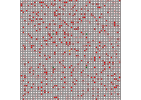

In [6]:
small = DenseGridWorld(size=(60,60))
render(small, (s=GWPos(30,30),)) # the orange circle represents the state (30,30)

You can evaluate either a `POMDPs.Policy` or a `POMDPs.Solver`

In [7]:
heuristic = FunctionPolicy(
    function pi(s) # this function represents a policy
        return :right # always go right
    end
);

In [20]:
# evaluate(heuristic, "hw3")

In [21]:
# evaluate(RandomSolver(), "hw3")

You may wish to use the MCTS package to solve this problem. Check the `MCTSSolver` docstring to see what tuning options are available.

In [22]:
using MCTS
solver = MCTSSolver(
    #=
    You probably want to use the max_time option because of the
    0.05 s limit on planning time. max_time only controls the
    iteration portion of the planning and there are a few other
    calculations, so it must be set to a little less than the
    limit
    =#
    max_time = 0.04,
    enable_tree_vis=true, # you may want to disable for max performance
);

# the solver is what you want to submit to be evaluated.
# it is commented out here because it will take several minutes

# evaluate(solver, "hw3")

In [17]:
planner = solve(solver, m);

You can view a tree created at a certain state as follows:

In [23]:
using D3Trees
a, info = action_info(planner, convert(statetype(m), GWPos(22,22)))
D3Tree(info[:tree], init_expand=2)

[22, 22]
N:    239

├──                       up
│  Q: -111.97
│  N:      1

│  └──                 [22, 23]
│     N:     18

│     ├──                       up
│     │  Q: -44.35
│     │  N:      1
 (1 children)
│     ├──                     down
│     │  Q:  -5.89
│     │  N:      4
 (1 children)
│     ├──                     left
│     │  Q: -44.96
│     │  N:      1
 (1 children)
│     └──                    right
│        Q:  -8.69
│        N:     12
 (1 children)
├──                     down
│  Q: -49.25
│  N:      1

│  └──                 [22, 21]
│     N:     18

│     ├──                       up
│     │  Q: -16.26
│     │  N:      3
 (1 children)
│     ├──                     down
│     │  Q: -17.68
│     │  N:      5
 (3 children)
│     ├──                     left
│     │  Q:  19.71
│     │  N:      9
 (1 children)
│     └──                    right
│        Q: -32.00
│        N:      1
 (1 children)
├──                     left
│  Q: -68.90
│  N:      1

│  └──                 [21, 22]
│     N:     15

│     ├──                       up
│     │  Q: -61.87
│     │  N:      1
 (1 children)
│     ├──                     down
│     │  Q: -21.35
│     │  N:      4
 (1 children)
│     ├──                     left
│     │  Q: -105.09
│     │  N:      1
 (1 children)
│     └──                    right
│        Q: -18.15
│        N:      9
 (2 children)
└──                    right
   Q:  -9.95
   N:    236

   ├──                 [22, 21]
   │  N:     18

   │  ├──                       up
   │  │  Q: -16.26
   │  │  N:      3
 (1 children)
   │  ├──                     down
   │  │  Q: -17.68
   │  │  N:      5
 (3 children)
   │  ├──                     left
   │  │  Q:  19.71
   │  │  N:      9
 (1 children)
   │  └──                    right
   │     Q: -32.00
   │     N:      1
 (1 children)
   ├──                 [23, 22]
   │  N:    228

   │  ├──                       up
   │  │  Q: -28.49
   │  │  N:      2
 (1 children)
   │  ├──                     down
   │  │  Q: -80.60
   │  │  N:      1
 (1 children)
   │  ├──                     left
   │  │  Q:  -7.15
   │  │  N:    174
 (4 children)
   │  └──                    right
   │     Q: -11.61
   │     N:     51
 (4 children)
   ├──                 [21, 22]
   │  N:     15

   │  ├──                       up
   │  │  Q: -61.87
   │  │  N:      1
 (1 children)
   │  ├──                     down
   │  │  Q: -21.35
   │  │  N:      4
 (1 children)
   │  ├──                     left
   │  │  Q: -105.09
   │  │  N:      1
 (1 children)
   │  └──                    right
   │     Q: -18.15
   │     N:      9
 (2 children)
   └──                 [22, 23]
      N:     18

      ├──                       up
      │  Q: -44.35
      │  N:      1
 (1 children)
      ├──                     down
      │  Q:  -5.89
      │  N:      4
 (1 children)
      ├──                     left
      │  Q: -44.96
      │  N:      1
 (1 children)
      └──                    right
         Q:  -8.69
         N:     12
 (1 children)

You can also view what the tree thinks the value is at each state like this:

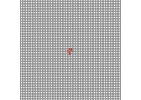

In [27]:
small_planner = solve(solver, small)
s = GWPos(30,30)
a, info = action_info(small_planner, s)

function val(s)
    tree = info[:tree]
    sid = get(tree.state_map, s, nothing)
    if isnothing(sid)
        return 0.0
    else
        return maximum(tree.q[c] for c in tree.child_ids[sid])
    end
end
render(small, (s=s,), color=val)

In [28]:
?MCTSSolver

search: MCTSSolver BeliefMCTSSolver AbstractMCTSSolver



MCTS solver type

Fields:

```
n_iterations::Int64
    Number of iterations during each action() call.
    default: 100

max_time::Float64
    Maximum amount of CPU time spent iterating through simulations.
    default: Inf

depth::Int64:
    Maximum rollout horizon and tree depth.
    default: 10

exploration_constant::Float64:
    Specifies how much the solver should explore.
    In the UCB equation, Q + c*sqrt(log(t/N)), c is the exploration constant.
    default: 1.0

rng::AbstractRNG:
    Random number generator

estimate_value::Any (rollout policy)
    Function, object, or number used to estimate the value at the leaf nodes.
    If this is a function `f`, `f(mdp, s, depth)` will be called to estimate the value.
    If this is an object `o`, `estimate_value(o, mdp, s, depth)` will be called.
    If this is a number, the value will be set to that number
    default: RolloutEstimator(RandomSolver(rng))

init_Q::Any
    Function, object, or number used to set the initial Q(s,a) value at a new node.
    If this is a function `f`, `f(mdp, s, a)` will be called to set the value.
    If this is an object `o`, `init_Q(o, mdp, s, a)` will be called.
    If this is a number, Q will be set to that number
    default: 0.0

init_N::Any
    Function, object, or number used to set the initial N(s,a) value at a new node.
    If this is a function `f`, `f(mdp, s, a)` will be called to set the value.
    If this is an object `o`, `init_N(o, mdp, s, a)` will be called.
    If this is a number, N will be set to that number
    default: 0

reuse_tree::Bool:
    If this is true, the tree information is re-used for calculating the next plan.
    Of course, clear_tree! can always be called to override this.
    default: false

enable_tree_vis::Bool:
    If this is true, extra information needed for tree visualization will
    be recorded. If it is false, the tree cannot be visualized.
    default: false
```

---

```
MCTSSolver()
```

Use keyword arguments to specify values for the fields.
